In [1]:
from vocoder_causal_conv.my_utils import CausalConvNet
from vocoder_causal_conv.encoder import EncoderCausalConvSinCos
from vocoder_causal_conv.vocoder import Vocoder
from ema_inverter_causal.causal_model import InverterCausalConv
from pitch_tracker.pitch_tracker import RTPitchTracker
import torch

In [2]:
import yaml

yaml_name = 'rtpt_6th_with_phead.yaml'
with open('pitch_tracker/yamls/' + yaml_name, "r") as stream:
    try:
        config = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)
model = RTPitchTracker(config['pitch_tracker_config'], use_realtime=True)
model.load_state_dict(torch.load('assets/Pitch_Tracker_rtpt_6th_with_phead_best.pth', map_location='cpu'), strict=False)
model.eval()

/tmp/ipykernel_2626838/1094298700.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('assets/Pitch_Tracker_rtpt_6th_with_phead_best.pth', 

RTPitchTracker(
  (conv): CausalConvNet(
    (conv_blocks): Sequential(
      (0): CausalConv1d(128, 512, kernel_size=(3,), stride=(1,))
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): CausalConv1d(512, 512, kernel_size=(3,), stride=(1,))
      (4): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
      (6): CausalConv1d(512, 512, kernel_size=(3,), stride=(1,))
      (7): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU()
      (9): CausalConv1d(512, 512, kernel_size=(3,), stride=(1,))
      (10): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (11): ReLU()
      (12): CausalConv1d(512, 512, kernel_size=(3,), stride=(1,))
    )
  )
  (lstm): LSTM(512, 512, batch_first=True)
  (pitch_head): MLP(
    (layers): Sequential(
      (0): Linear(in_features=512, out_features=512, bias=Tr

In [3]:
chunk = torch.randn(1, 128, 400)
context = torch.randn(1, 128, 10)
with torch.no_grad():
    pitch, periodicity = model.realtime_forward(chunk, context, None)
pitch.shape

torch.Size([1, 1, 400])

In [4]:
CONTEXT_LEN = 10

In [4]:
model = CausalConvNet(in_channels=4, hidden_dim=10, out_channels=1, kernel_size=3, n_blocks=3, use_realtime=True).eval()


In [5]:
x = torch.randn(4, 4, 500)
with torch.no_grad():
    y = model.realtime_forward(x)
print(x.shape, y.shape)

torch.Size([4, 4, 500]) torch.Size([4, 1, 418])


In [4]:
model = EncoderCausalConvSinCos(use_realtime=True, nharmonics=80, nbands=257, kernel_size=3).eval()
f0 = torch.randn(4, 1, 500)
loudness = torch.randn(4, 1, 500)
periodicity = torch.randn(4, 1, 500)
ema = torch.randn(4, 12, 500)
spkr_emb = torch.randn(4, 128)

with torch.no_grad():
    y = model.realtime_forward(f0, loudness, periodicity, ema, spkr_emb)
print(f0.shape, y[0].shape)



torch.Size([4, 1, 500]) torch.Size([4, 80, 418])


In [ ]:
CONTEXT_LEN = 82

In [7]:
x = [1,2,3,4]
x[:-1]

[1, 2, 3]

In [5]:
import yaml
yaml_name = 'rt_vocoder_4th.yaml'
with open('vocoder_causal_conv/yamls/' + yaml_name, "r") as stream:
    try:
        config = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)

model = Vocoder(**config['vocoder_config'], use_realtime=True).eval()
f0 = torch.randn(4, 1, 500)
loudness = torch.randn(4, 1, 500)
periodicity = torch.randn(4, 1, 500)
ema = torch.randn(4, 12, 500)

f0_left_context = torch.randn(4, 1, 82)
loudness_left_context = torch.randn(4, 1, 82)
periodicity_left_context = torch.randn(4, 1, 82)
ema_left_context = torch.randn(4, 12, 82)

spkr_emb = torch.randn(4, 128)

with torch.no_grad():
    y = model.realtime_forward(f0, f0_left_context, loudness, loudness_left_context, periodicity, periodicity_left_context, ema, ema_left_context, spkr_emb)
print(f0.shape, y[0].shape)

torch.Size([4, 1, 500]) torch.Size([40000])


In [2]:
import yaml

yaml_name = 'causal_conv_mfcc_9th.yaml'
with open('ema_inverter_causal/yamls/' + yaml_name, "r") as stream:
    try:
        config = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)
    
model = InverterCausalConv(in_channels=24, hidden_dim=384, out_channels=12, kernel_size=7, use_realtime=True).eval() 


In [ ]:
x = torch.randn(4, 500, 24)
context = torch.randn(4, 246, 24)
with torch.no_grad():
    y = model.realtime_forward(x, context)
    
print(y.shape)


torch.Size([4, 500, 12])


In [ ]:
CONTEXT_LEN = 246

In [29]:
noise_dict = {'white': 0.0, 'pink': -3.01, 'brown': -6.02}
for key in noise_dict.keys():
    print(noise_dict[key])

0.0
-3.01
-6.02


In [7]:
from librosa import resample
import os
import soundfile as sf

source_root = '/home/louis/RT-DDSP-VC/assets/streamvc_source'
source_list = os.listdir(source_root)
for wavname in source_list:
    source_path = os.path.join(source_root, wavname)
    x, fs = sf.read(source_path)
    x = resample(x, orig_sr=fs, target_sr=16000)
    sf.write(source_path, x, samplerate=16000)



In [1]:
from infer_utils_causal_conv import *
import torch
import os
from audiomentations import AddColorNoise
import matplotlib.pyplot as plt
device = 'cpu'

In [2]:
vocoder, spkr_encoder = load_vocoder('vocoder_causal_conv/yamls/rt_vocoder_4th.yaml', device=device)
pitch_tracker_non_realtime = load_pitch_tracker('pitch_tracker/yamls/rtpt_6th_with_phead.yaml', device=device, use_realtime=False)
ema_inverter_non_realtime = load_ema_inverter('ema_inverter_causal/yamls/causal_conv_mfcc_9th.yaml', device=device, use_realtime=False)
system = VC(framesize=80, vocoder=vocoder, spkr_encoder=spkr_encoder, pitch_tracker=pitch_tracker_non_realtime, ema_inverter=ema_inverter_non_realtime, device=device)


/home/louis/RT-DDSP-VC/infer_utils_causal_conv.py:293: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vocoder.load_state_dict(torch.load(config['vocoder_ckpt_path'], map_loca

In [7]:
src_path = "/home/louis/RT-DDSP-VC/assets/Musical.wav"
tgt_path = "/home/louis/RT-DDSP-VC/assets/p227_005.wav"

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)

In [29]:
src_path = "/home/louis/RT-DDSP-VC/assets/Jazz.wav"
tgt_path = "/home/louis/RT-DDSP-VC/assets/p237_003.wav"

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)

In [19]:
src_path = "/home/louis/RT-DDSP-VC/assets/English_song1.wav"
tgt_path = "/home/louis/RT-DDSP-VC/assets/p229_006.wav"

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)

In [36]:
src_path = "/home/louis/RT-DDSP-VC/assets/moli.mp3"
tgt_path = "/home/louis/RT-DDSP-VC/assets/gopala.wav"

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)

In [40]:
src_path = "/home/louis/RT-DDSP-VC/assets/qingchun.mp3"
tgt_path = "/data/ddsp_data/VCTK/VCTK_2000/p274_014_mic1_16k.flac"

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)

In [50]:
src_path = "/home/louis/RT-DDSP-VC/assets/chinese_SSB07110388-enhanced-v2.wav"
tgt_path = "/data/ddsp_data/VCTK/VCTK_2000/p226_046_mic1_16k.flac"

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)

In [57]:
src_path = "/home/louis/RT-DDSP-VC/assets/german_11695_8674_000043-enhanced-v2.wav"
tgt_path = "/home/louis/RT-DDSP-VC/assets/p227_005.wav"

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)

In [62]:
src_path = "/home/louis/RT-DDSP-VC/assets/spanish_11266_10604_000007-enhanced-v2.wav"
tgt_path = "/home/louis/RT-DDSP-VC/assets/p236_021.wav"

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)

In [68]:
src_path = "/home/louis/RT-DDSP-VC/assets/french_12977_10625_000089-enhanced-v2.wav"
tgt_path = "/data/ddsp_data/VCTK/VCTK_2000/p265_070_mic1_16k.flac"

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)

In [76]:
src_path = "/home/louis/RT-DDSP-VC/assets/lar1-enhanced-v2.wav"
tgt_path = "/data/ddsp_data/VCTK/VCTK_2000/p298_207_mic1_16k.flac"

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)

In [77]:
tgt, fs = sf.read(tgt_path)
sf.write('/data/ddsp_data/ACL_Eval/web_wavfiles/multilingual_conversion/Arabic/target.wav', tgt, samplerate=16000)

In [78]:
src, fs = sf.read(src_path)
src = librosa.resample(src, orig_sr=fs, target_sr=16000)
sf.write('/data/ddsp_data/ACL_Eval/web_wavfiles/multilingual_conversion/Arabic/source.wav', src, samplerate=16000)

In [79]:
sf.write('/data/ddsp_data/ACL_Eval/web_wavfiles/multilingual_conversion/Arabic/converted.wav', transformed, samplerate=16000)

In [14]:
src_path = "/data/ddsp_data/multilingual_speech/chinese_SSB06930335.wav"
tgt_path = "/home/louis/RT-DDSP-VC/assets/p227_005.wav"

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)

In [3]:
src_path = '/home/louis/RT-DDSP-VC/assets/chinese_SSB06930335-enhanced-v2.wav'
tgt_path = "/home/louis/RT-DDSP-VC/assets/p227_005.wav"

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)

In [15]:
play_audio(src_path, fs=16000)

In [64]:
src_path = "/data/ddsp_data/VCTK/VCTK_2000/p225_001_mic1_16k.flac"
tgt_path = "/data/ddsp_data/VCTK/VCTK_2000/p227_054_mic1_16k.flac"

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)

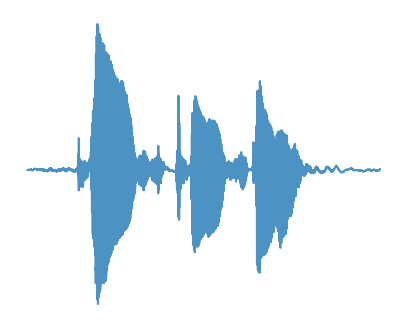

In [31]:
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt

# file1 = tgt_path

# audio1, rate1 = sf.read(file1)
audio1 = transformed
rate1 = 16000

# Create a time array for plotting
time = np.arange(0, len(audio1)) / rate1

# Define visually pleasing colors
# color_audio1 = "crimson" 

# Plot the mixed audio with custom colors and transparency
plt.figure(figsize=(5, 4))
# plt.plot(time, audio1, color='orchid')
plt.plot(time, audio1, alpha=0.8)
plt.xticks([])
plt.yticks([])
plt.axis('off')

# Save the plot without white margins
plt.savefig("/data/ddsp_data/ACL_Eval/imags/reconstructed.jpg", bbox_inches='tight', pad_inches=0.0)

In [48]:
src, fs = sf.read(src_path)
tgt, fs = sf.read(tgt_path)

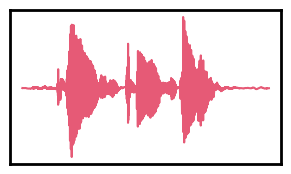

In [66]:
import matplotlib.pyplot as plt
import numpy as np

audio = transformed
rate = fs

# Create a time array for plotting
time = np.arange(0, len(audio)) / rate

fig, ax = plt.subplots(figsize=(3.5, 2))
ax.plot(time, audio, color='crimson', alpha=0.7)
# ax.plot(time, audio, alpha=0.8)
# plt.plot(time, audio, color='orchid')

# Hide tick marks and labels but retain the spines (the axis frame)
ax.tick_params(axis='both', which='both',
               bottom=False, top=False, left=False, right=False,
               labelbottom=False, labelleft=False)

# Optionally, customize the spines (border)
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_color('black')

plt.savefig("/data/ddsp_data/ACL_Eval/imags/converted.jpg", bbox_inches='tight')


In [3]:
src_list = os.listdir('/data/ddsp_data/ACL_Eval/source_wavs/')

In [5]:
play_audio(src_path)

In [4]:
src_path = os.path.join("/data/ddsp_data/LibriTTS_R/wavs/", src_list[1])
tgt_path = "/home/louis/RT-DDSP-VC/assets/p236_021.wav"

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)


In [9]:
src_path = '/home/louis/RT-DDSP-VC/assets/lar1-enhanced-v2.wav'
tgt_path = "/home/louis/RT-DDSP-VC/assets/p236_021.wav"

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)


In [5]:
src_path = os.path.join('/data/ddsp_data/ACL_Eval/source_wavs/', src_list[80])
tgt_path = 'assets/p229_006.wav'

transformed = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)


In [7]:
src_path = os.path.join('/data/ddsp_data/ACL_Eval/source_wavs/', src_list[80])
tgt_path = 'assets/p229_006.wav'

transformed = system.vc_full(src_path, tgt_path)
play_audio(transformed, fs=16000)


In [14]:
src_path = os.path.join("/data/ddsp_data/LibriTTS_R/wavs/", src_list[80])
tgt_path = 'assets/p229_006.wav'
augmentation = AddColorNoise(min_snr_db=10, max_snr_db=10, p=1, min_f_decay=0.0, max_f_decay=0.0)

src, fs = sf.read(src_path)
src = augmentation(src, sample_rate=fs)
sf.write('temp.wav', src, samplerate=fs)

play_audio(src, fs=16000)


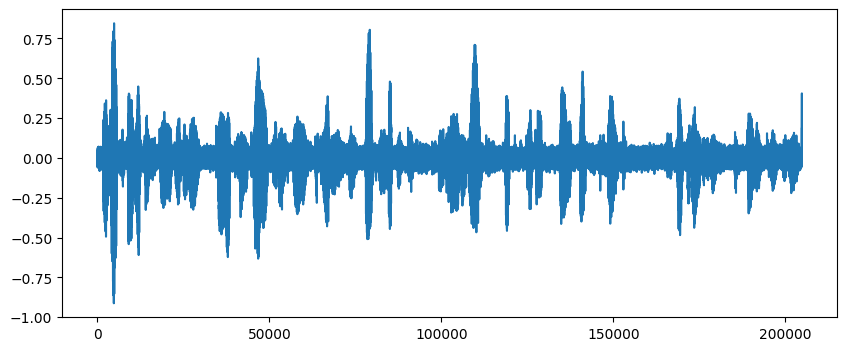

In [15]:
plt.figure(figsize=(10, 4))
plt.plot(src)

In [16]:
play_audio(src_path)

In [ ]:
src_path = 'temp.wav'
tgt_path = 'assets/p237_003.wav'

transformed, loudness = system.vc(src_path, tgt_path)
play_audio(transformed, fs=16000)


In [18]:
src_path = 'temp.wav'
tgt_path = 'assets/p237_003.wav'

transformed, loudness_pred = system.vc_full(src_path, tgt_path)
play_audio(transformed, fs=16000)

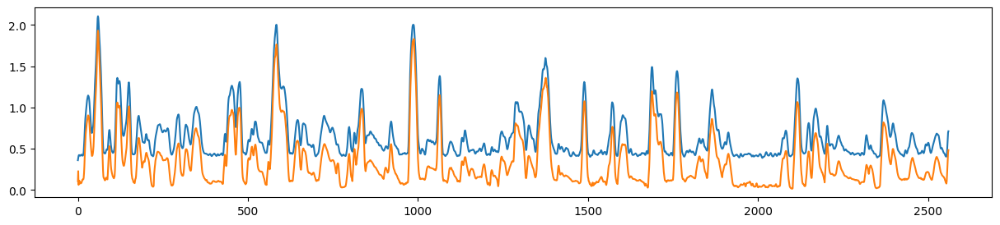

In [19]:
plt.figure(figsize=(15, 3))
plt.plot(loudness.squeeze())
plt.plot(loudness_pred.squeeze())

In [14]:
src_path = 'temp.wav'
tgt_path = 'assets/p237_003.wav'
loudness_path = os.path.join("/data/ddsp_data/LibriTTS_R/wavs/", src_list[80])

transformed = system.vc2(src_path, tgt_path, loudness_path)
play_audio(transformed, fs=16000)


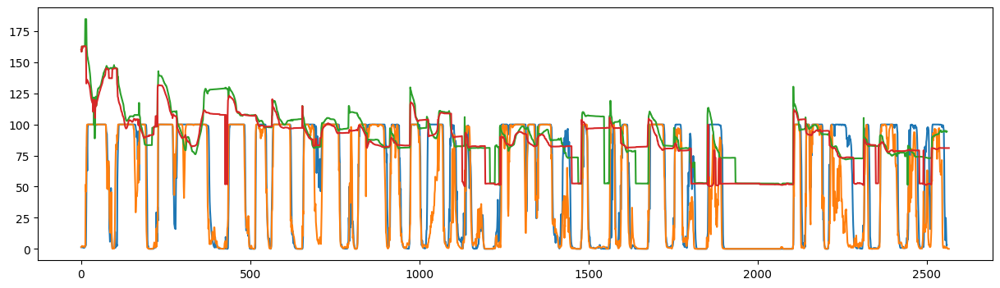

In [86]:
pitch, periodicity = system.get_pitch('temp.wav')
_, p = system.get_pitch(os.path.join('/data/ddsp_data/ACL_Eval/source_wavs/', src_list[80]))
plt.figure(figsize=(15, 4))
plt.plot(periodicity.squeeze()*100)
plt.plot(p.squeeze()*100)
plt.plot(pitch.squeeze())
plt.plot(_.squeeze())

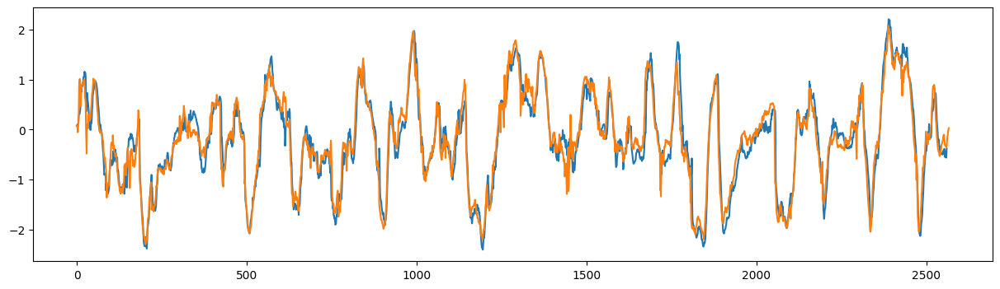

In [94]:
ema_r = system.get_ema('temp.wav').squeeze()
ema = system.get_ema(os.path.join('/data/ddsp_data/ACL_Eval/source_wavs/', src_list[80])).squeeze()
c = 6
plt.figure(figsize=(15, 4))
plt.plot(ema_r[c])
plt.plot(ema[c])

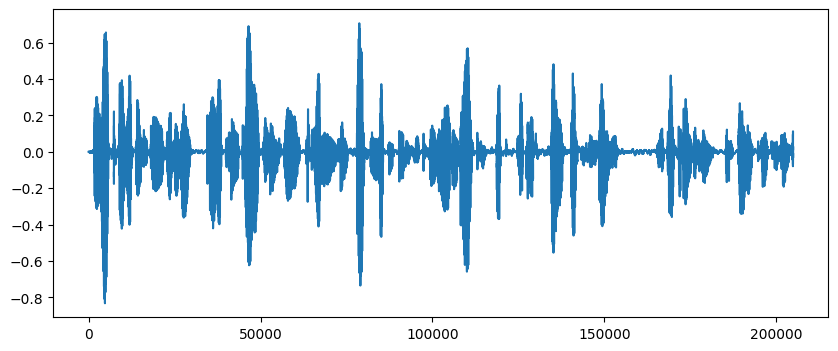

In [70]:
plt.figure(figsize=(10, 4))
plt.plot(transformed)

In [16]:
src_path

'/data/ddsp_data/LibriTTS_R/wavs/3575_170457_000010_000007.wav'

In [20]:
play_audio(src_path)

In [13]:
system.ema_inverter

InverterCausalConv(
  (pre_conv): Sequential(
    (0): CausalConv1d(24, 384, kernel_size=(7,), stride=(1,))
    (1): BatchNorm1d(384, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): EncoderBlock(
      (layers): Sequential(
        (0): ResidualUnit(
          (layers): Sequential(
            (0): CausalConv1d(384, 384, kernel_size=(7,), stride=(1,))
            (1): BatchNorm1d(384, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU()
          )
        )
        (1): ResidualUnit(
          (layers): Sequential(
            (0): CausalConv1d(384, 384, kernel_size=(7,), stride=(1,), dilation=(3,))
            (1): BatchNorm1d(384, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU()
          )
        )
        (2): ResidualUnit(
          (layers): Sequential(
            (0): CausalConv1d(384, 384, kernel_size=(7,), stride=(1,), dilation=(9,))
            (1): BatchNorm1

In [3]:
import os
import soundfile as sf
from audiomentations import AddColorNoise
from tqdm import tqdm

In [6]:
db_list = [40, 30, 20, 10, 5]
conversion_list = ['1089_134686_000002_000001_to_p231_target.wav', "1580_141083_000006_000000_to_p334_target.wav"]
source_list = ['1089_134686_000002_000001.wav', "1580_141083_000006_000000.wav"]
source_root = "/data/ddsp_data/LibriTTS_R/wavs/"
save_root = '/data/ddsp_data/ACL_Eval/web_wavfiles/noise_robustness/'
conversion_root = '/data/ddsp_data/ACL_Eval/noise_robust/white/'

for db in tqdm(db_list):
    save_dir = os.path.join(save_root, f'{db}dB')
    os.makedirs(save_dir, exist_ok=True)
    for source_wav, converted_wav in zip(source_list, conversion_list):
        src, fs = sf.read(os.path.join(source_root, source_wav))
        augmentation = AddColorNoise(min_snr_db=db, max_snr_db=db, p=1, min_f_decay=0.0, max_f_decay=0.0) # white noise
        src = augmentation(src, sample_rate=fs)
        converted, fs = sf.read(os.path.join(conversion_root, f'{db}dB', converted_wav))
        sf.write(os.path.join(save_dir, source_wav), src, samplerate=16000)
        sf.write(os.path.join(save_dir, converted_wav), converted, samplerate=16000)

100%|██████████| 5/5 [00:00<00:00, 59.86it/s]
